In [1]:
import os
import shutil
import hashlib
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.layers import (GlobalAveragePooling2D, Dense, Dropout,
                                     BatchNormalization)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras import Sequential as KSequential
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast, RandomTranslation, RandomBrightness
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.regularizers import l2
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import cv2
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications import ResNet50



In [2]:

# Configuration

MAIN_DATA_DIR = "/Images"
IMG_SIZE = 224      
BATCH_SIZE = 32
EPOCHS_TOP = 25      # Stage 1: train top layers only
EPOCHS_FINE = 10      # Stage 2: fine-tune backbone
CONFIDENCE_THRESHOLD = 0.9
AUTOTUNE = tf.data.AUTOTUNE

In [3]:


# Data Cleaning Functions

def find_and_remove_corrupted_images(directory):
    if not os.path.exists(directory):
        print(f"Directory not found: {directory}")
        return

    print(f"Checking for corrupted images in: {directory}")
    corrupted_count = 0
    total_count = 0

    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                total_count += 1
                file_path = os.path.join(root, file)
                try:
                    with Image.open(file_path) as img:
                        img.verify()
                except (IOError, SyntaxError):
                    print(f"Deleting corrupted image: {file_path}")
                    os.remove(file_path)
                    corrupted_count += 1

    print(f"Removed {corrupted_count} corrupted images out of {total_count}")


def remove_duplicate_images(directory):
    print(f"Removing duplicates in: {directory}")
    hashes = {}
    duplicate_count = 0

    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                file_path = os.path.join(root, file)
                with open(file_path, "rb") as f:
                    file_hash = hashlib.md5(f.read()).hexdigest()
                if file_hash in hashes:
                    os.remove(file_path)
                    duplicate_count += 1
                else:
                    hashes[file_hash] = file_path

    print(f"Removed {duplicate_count} duplicate images")


# Clean datasets
for subdir in ["/Plant Name", "/Plant Species", "/Plant Organ Type", "/Plant Health", "/Edibility"]:
    full_dir = os.path.join(MAIN_DATA_DIR, subdir)
    find_and_remove_corrupted_images(full_dir)
    remove_duplicate_images(full_dir)

Directory not found: /Plant Name
Removing duplicates in: /Plant Name
Removed 0 duplicate images
Directory not found: /Plant Species
Removing duplicates in: /Plant Species
Removed 0 duplicate images
Directory not found: /Plant Organ Type
Removing duplicates in: /Plant Organ Type
Removed 0 duplicate images
Directory not found: /Plant Health
Removing duplicates in: /Plant Health
Removed 0 duplicate images
Directory not found: /Edibility
Removing duplicates in: /Edibility
Removed 0 duplicate images



--- Loading Plant Name Dataset ---
Found 18194 files belonging to 26 classes.
Using 14556 files for training.
Found 18194 files belonging to 26 classes.
Using 3638 files for validation.
Plant Name Classes: ['Alovera', 'Apple', 'Begonia', 'Calla_lily', 'Daisy', 'Dendelion', 'Dhalia', 'Grape', 'Iris', 'Jasmine', 'Lavender', 'Lotus', 'Mango', 'Merigold', 'Orcid', 'Poppy', 'Potato', 'Respberry', 'Rose', 'Snack_plant', 'Spider_plant', 'Strawberry', 'Sunflower', 'Tomato', 'Tulip', 'Tulsi']

--- Loading Plant Species Dataset ---
Found 18194 files belonging to 26 classes.
Using 14556 files for training.
Found 18194 files belonging to 26 classes.
Using 3638 files for validation.
Plant Species Classes: ['Aloe barbadensis miller', 'Begonia spp', 'Bellis perennis', 'Chlorophytum comosum', 'Dahlia pinnata', 'Dracaena trifasciata', 'Fragaria × ananassa', 'Helianthus annuus', 'Iris germanica', 'Jasminum sambac', 'Lavandula angustifolia', 'Malus domestica', 'Mangifera indica', 'Nelumbo nucifera', 'Oc

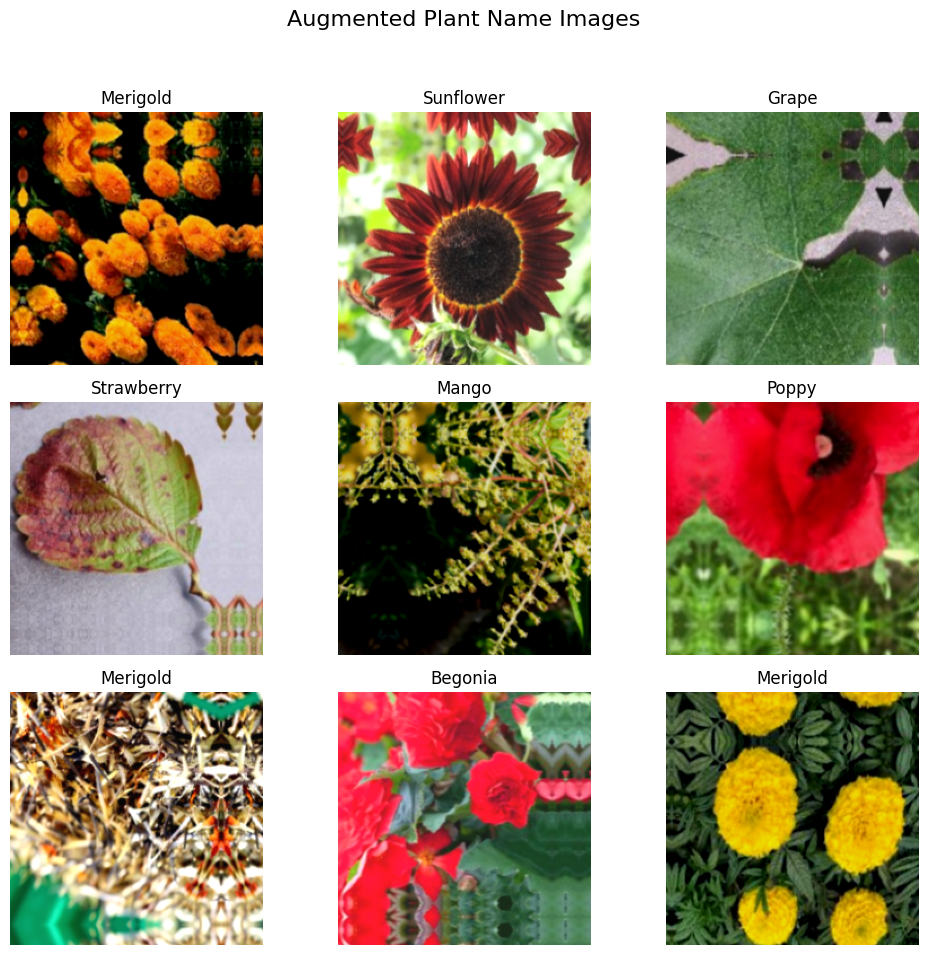

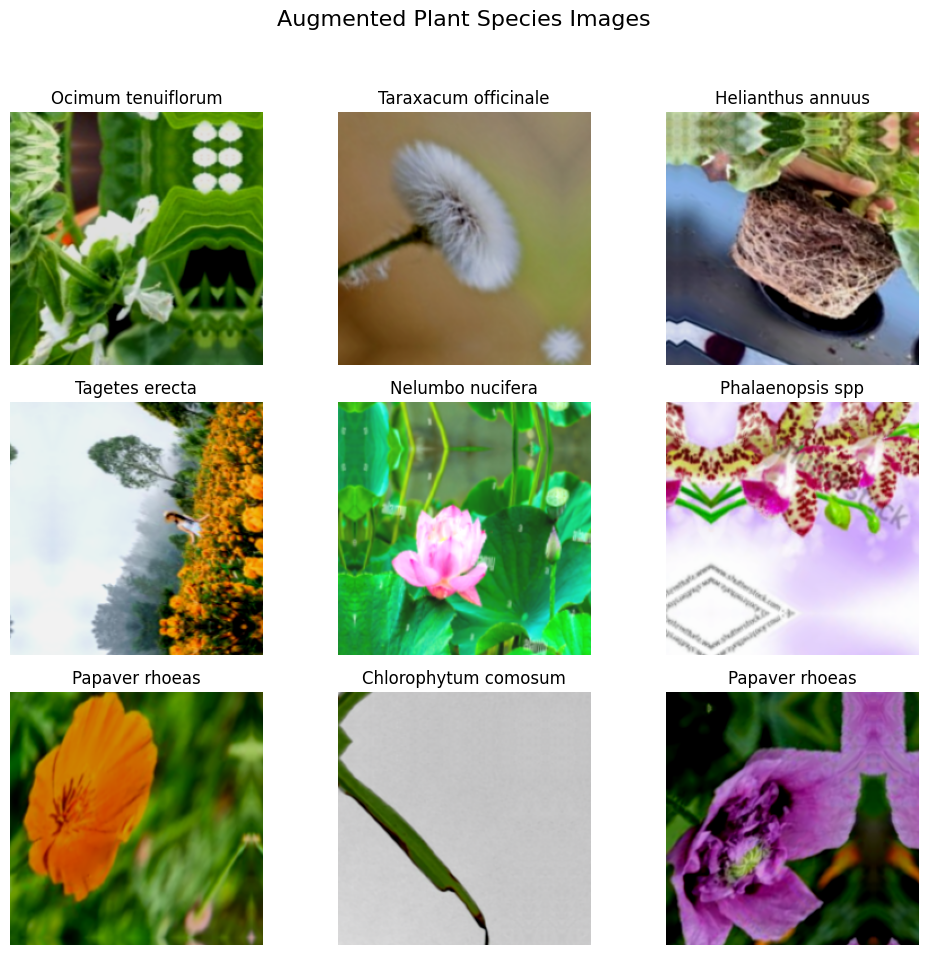

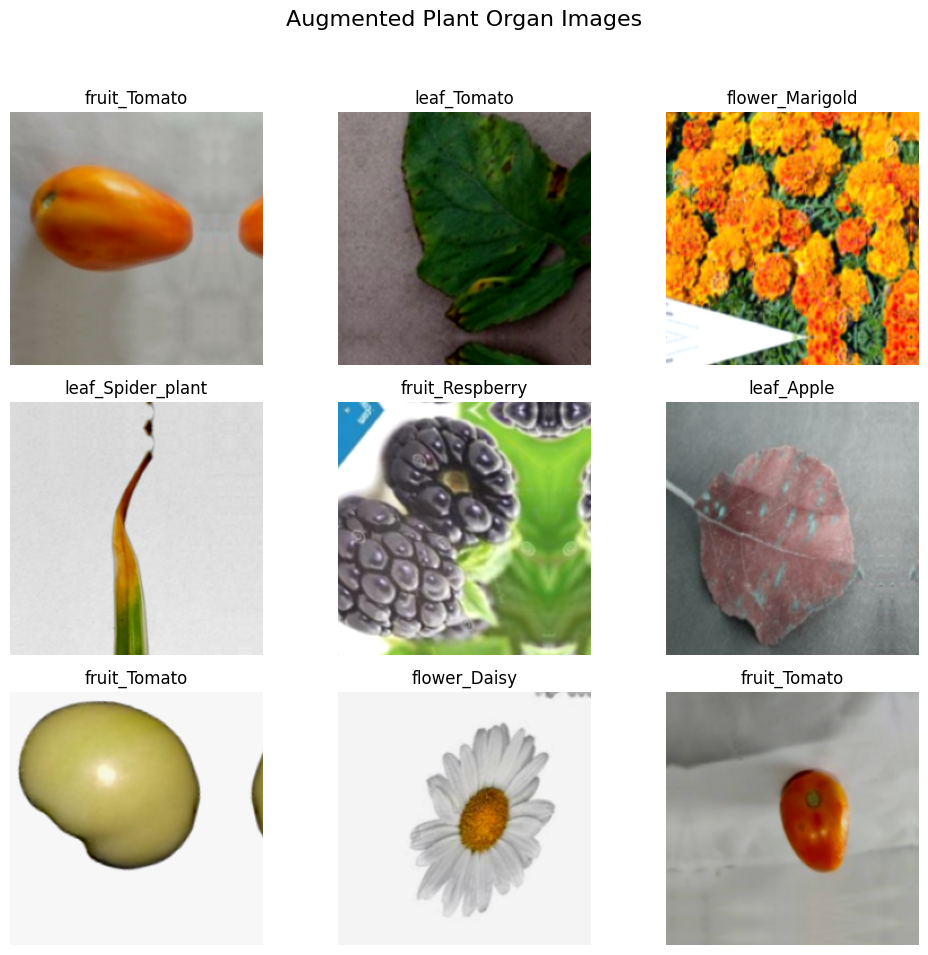

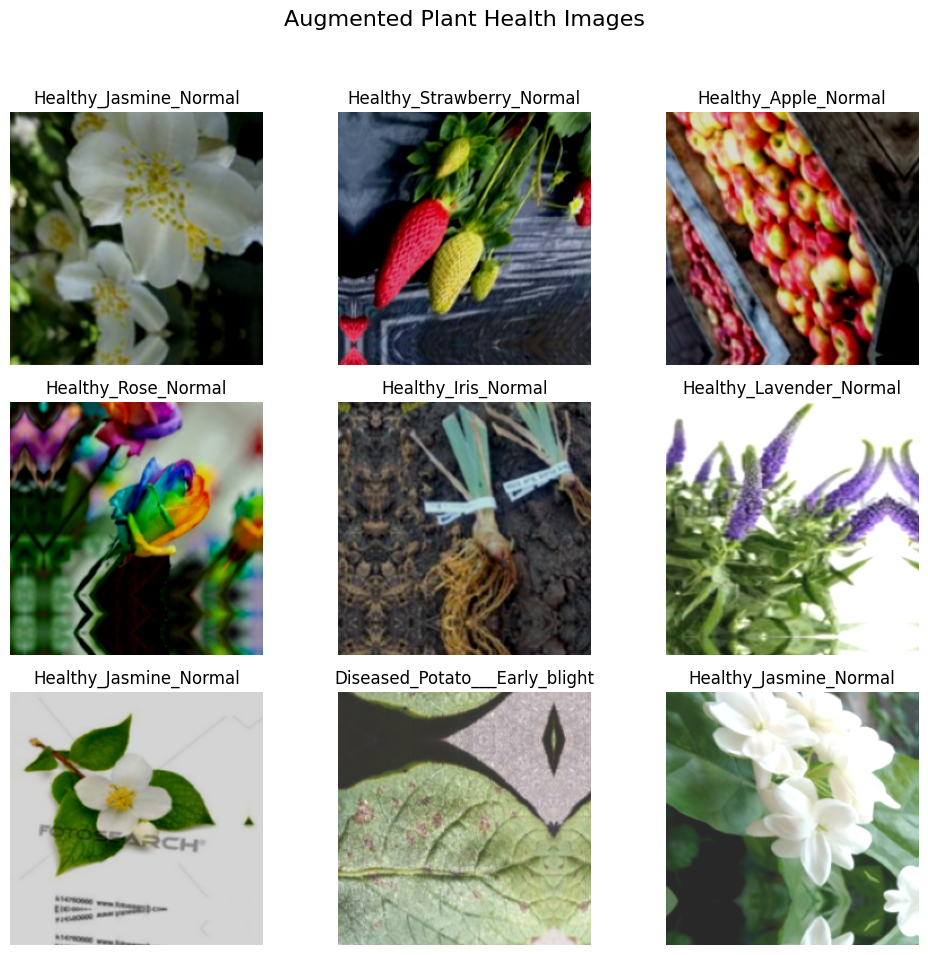

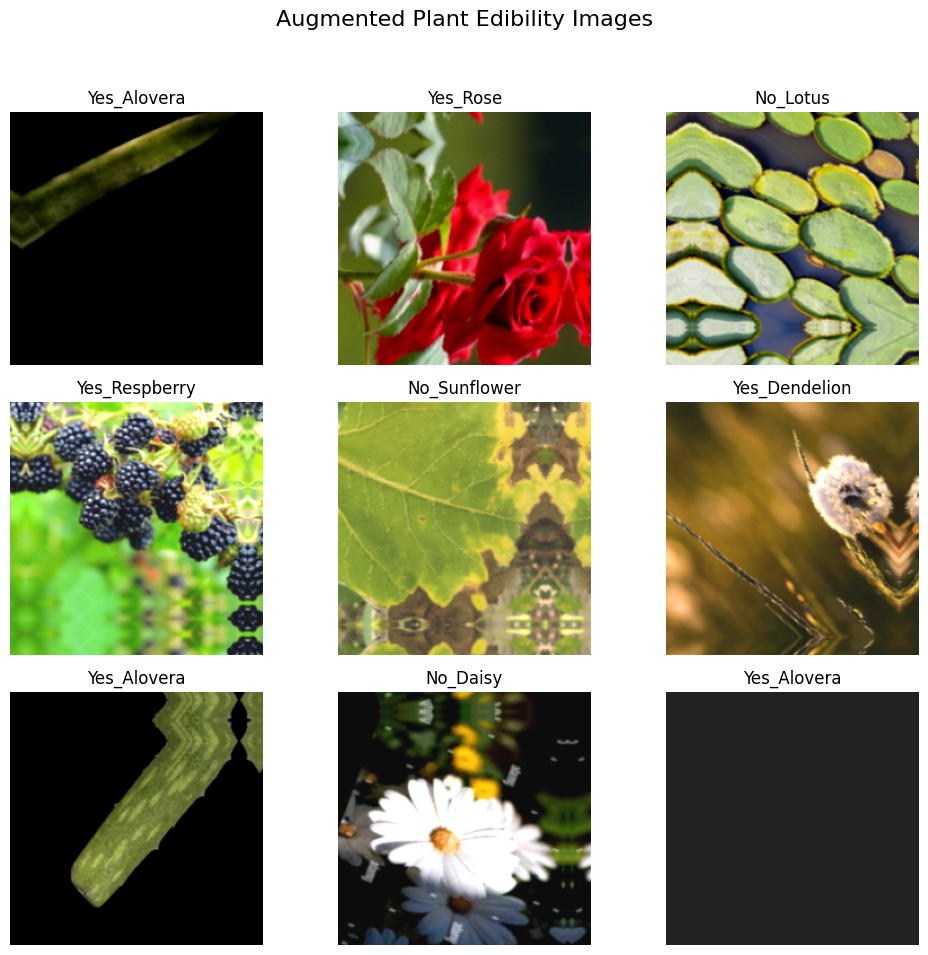

In [4]:

# --- Data Augmentation Layer ---
data_augmentation = KSequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomContrast(0.3),
    RandomTranslation(height_factor=0.2, width_factor=0.2),
    RandomBrightness(0.2)
])

# --- Utility function for visualization ---
def visualize_dataset(dataset, class_names, title):
    plt.figure(figsize=(10,10))
    for images, labels in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3,3,i+1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(f"{class_names[labels[i]]}")
            plt.axis("off")
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0,0.03,1,0.95])
    plt.show()

# ==============================
# --- Plant Name Dataset ---
# ==============================
print("\n--- Loading Plant Name Dataset ---")
train_plant_name_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"C:/Users/USER/Desktop/plant1/Images/Plant Name"),
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_name_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"C:/Users/USER/Desktop/plant1/Images/Plant Name"),
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_names = train_plant_name_ds.class_names
print(f"Plant Name Classes: {plant_names}")

train_plant_name_ds = train_plant_name_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_name_ds = val_plant_name_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Species Dataset ---
# ==============================
print("\n--- Loading Plant Species Dataset ---")
train_plant_species_ds = tf.keras.utils.image_dataset_from_directory(
    "C:/Users/USER/Desktop/plant1/Images/Plant Species",
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

val_plant_species_ds = tf.keras.utils.image_dataset_from_directory(
    "C:/Users/USER/Desktop/plant1/Images/Plant Species",
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_species = train_plant_species_ds.class_names
print(f"Plant Species Classes: {plant_species}")

train_plant_species_ds = train_plant_species_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_species_ds = val_plant_species_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Organ Dataset ---
# ==============================
print("\n--- Loading Plant Organ Dataset ---")
plant_organ_tmp_dir = 'tmp_plant_organ_dataset'
if os.path.exists(plant_organ_tmp_dir):
    shutil.rmtree(plant_organ_tmp_dir)
os.makedirs(plant_organ_tmp_dir)

for organ in os.listdir(os.path.join(MAIN_DATA_DIR,"C:/Users/USER/Desktop/plant1/Images/Plant Organ Type")):
    organ_path = os.path.join(MAIN_DATA_DIR,"C:/Users/USER/Desktop/plant1/Images/Plant Organ Type", organ)
    if os.path.isdir(organ_path):
        for plant in os.listdir(organ_path):
            plant_path = os.path.join(organ_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{organ}_{plant}"
                new_class_path = os.path.join(plant_organ_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_organ_ds = tf.keras.utils.image_dataset_from_directory(
    plant_organ_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_organ_ds = tf.keras.utils.image_dataset_from_directory(
    plant_organ_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_organs = train_plant_organ_ds.class_names
print(f"Plant Organ Classes: {plant_organs}")

train_plant_organ_ds = train_plant_organ_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_organ_ds = val_plant_organ_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Health Dataset ---
# ==============================
print("\n--- Loading Plant Health Dataset ---")
plant_health_tmp_dir = 'tmp_plant_health_dataset'
if os.path.exists(plant_health_tmp_dir):
    shutil.rmtree(plant_health_tmp_dir)
os.makedirs(plant_health_tmp_dir)

for health in os.listdir(os.path.join(MAIN_DATA_DIR,"C:/Users/USER/Desktop/plant1/Images/Plant Health")):
    health_path = os.path.join(MAIN_DATA_DIR,"C:/Users/USER/Desktop/plant1/Images/Plant Health", health)
    if os.path.isdir(health_path):
        for plant in os.listdir(health_path):
            plant_path = os.path.join(health_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{health}_{plant}"
                new_class_path = os.path.join(plant_health_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_health_ds = tf.keras.utils.image_dataset_from_directory(
    plant_health_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_health_ds = tf.keras.utils.image_dataset_from_directory(
    plant_health_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_health = train_plant_health_ds.class_names
print(f"Plant Health Classes: {plant_health}")

train_plant_health_ds = train_plant_health_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_health_ds = val_plant_health_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Edibility Dataset ---
# ==============================
print("\n--- Loading Plant Edibility Dataset ---")
plant_edibility_tmp_dir = 'tmp_plant_edibility_dataset'
if os.path.exists(plant_edibility_tmp_dir):
    shutil.rmtree(plant_edibility_tmp_dir)
os.makedirs(plant_edibility_tmp_dir)

for edibility in os.listdir(os.path.join(MAIN_DATA_DIR,"C:/Users/USER/Desktop/plant1/Images/Edibility")):
    edibility_path = os.path.join(MAIN_DATA_DIR,"C:/Users/USER/Desktop/plant1/Images/Edibility", edibility)
    if os.path.isdir(edibility_path):
        for plant in os.listdir(edibility_path):
            plant_path = os.path.join(edibility_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{edibility}_{plant}"
                new_class_path = os.path.join(plant_edibility_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_edibility_ds = tf.keras.utils.image_dataset_from_directory(
    plant_edibility_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_edibility_ds = tf.keras.utils.image_dataset_from_directory(
    plant_edibility_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_edibility = train_plant_edibility_ds.class_names
print(f"Plant Edibility Classes: {plant_edibility}")

train_plant_edibility_ds = train_plant_edibility_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_edibility_ds = val_plant_edibility_ds.prefetch(buffer_size=AUTOTUNE)



# ==============================
# --- Visualizations for all 
# ==============================
visualize_dataset(train_plant_name_ds, plant_names, "Augmented Plant Name Images")
visualize_dataset(train_plant_species_ds, plant_species, "Augmented Plant Species Images")
visualize_dataset(train_plant_organ_ds, plant_organs, "Augmented Plant Organ Images")
visualize_dataset(train_plant_health_ds, plant_health, "Augmented Plant Health Images")
visualize_dataset(train_plant_edibility_ds, plant_edibility, "Augmented Plant Edibility Images")



In [5]:
# --- Model Builder

def build_model(num_classes, img_size=224):
    base_model = ResNet50(
        weights="imagenet",
        include_top=False,
        input_shape=(img_size, img_size, 3)
    )

    # Unfreeze more layers for richer fine-tuning 
    for layer in base_model.layers[:-50]:
        layer.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)

    
    x = Dense(1024, activation="relu", kernel_regularizer=l2(1e-4))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)

    
    x = Dense(512, activation="relu", kernel_regularizer=l2(1e-4))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    
    x = Dense(256, activation="relu", kernel_regularizer=l2(1e-4))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    outputs = Dense(num_classes, activation="softmax")(x)

    model = Model(inputs=base_model.input, outputs=outputs)
    model.compile(
    optimizer=Adam(learning_rate=5e-5),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"]
)
    return model

# -----------------------------
# --- Callbacks ---
# -----------------------------
def get_callbacks(model_name):
    return [
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, verbose=1),
        ModelCheckpoint(f'{model_name}.keras', monitor='val_accuracy', save_best_only=True, verbose=1)
    ]

# -----------------------------
# --- Generic Training Function ---
# -----------------------------
def train_model(train_ds, val_ds, class_names, model_name, img_size=IMG_SIZE):
    print(f"\n=== Training {model_name} Model ===")
    model = build_model(len(class_names), img_size)
    model.summary()

    # Prefetch datasets once
    train_ds_prefetch = train_ds.prefetch(AUTOTUNE)
    val_ds_prefetch = val_ds.prefetch(AUTOTUNE)

    # Stage 1: Train top layers only
    print("\n--- Stage 1: Training top layers only ---")
    history_stage1 = model.fit(
        train_ds_prefetch,
        validation_data=val_ds_prefetch,
        epochs=EPOCHS_TOP,
        callbacks=get_callbacks(f"{model_name}_stage1"),
        verbose=1
    )

    # Stage 2: Fine-tune top 30 layers of backbone
    print("\n--- Stage 2: Fine-tuning top backbone layers ---")
    for layer in model.layers[-30:]:
        if not isinstance(layer, tf.keras.layers.BatchNormalization):
            layer.trainable = True
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    history_stage2 = model.fit(
        train_ds_prefetch,
        validation_data=val_ds_prefetch,
        epochs=EPOCHS_FINE,
        callbacks=get_callbacks(f"{model_name}_stage2"),
        verbose=1
    )
    
    return model, (history_stage1, history_stage2)

# -----------------------------
# --- Train All Datasets ---
# -----------------------------
datasets = [
    (train_plant_name_ds, val_plant_name_ds, plant_names, "Plant_Name"),
    (train_plant_species_ds, val_plant_species_ds, plant_species, "Plant_Species"),
    (train_plant_organ_ds, val_plant_organ_ds, plant_organs, "Plant_Organ"),
    (train_plant_health_ds, val_plant_health_ds, plant_health, "Plant_Health"),
    (train_plant_edibility_ds, val_plant_edibility_ds, plant_edibility, "Plant_Edibility"),
]

trained_models = {}

for train_ds, val_ds, classes, name in datasets:
    model, history = train_model(train_ds, val_ds, classes, name, IMG_SIZE)
    trained_models[name] = {"model": model, "history": history}

print("\n All datasets trained successfully")



=== Training Plant_Name Model ===


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 26,355,866 (100.54 MB)

 Trainable params: 19,715,098 (75.21 MB)

 Non-trainable params: 6,640,768 (25.33 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 881ms/step - accuracy: 0.1435 - loss: 3.7884
Epoch 1: val_accuracy improved from None to 0.63084, saving model to Plant_Name_stage1.keras

Epoch 1: finished saving model to Plant_Name_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 472s 1s/step - accuracy: 0.2521 - loss: 3.1665 - val_accuracy: 0.6308 - val_loss: 1.5935 - learning_rate: 5.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 910ms/step - accuracy: 0.4850 - loss: 2.1224
Epoch 2: val_accuracy improved from 0.63084 to 0.73804, saving model to Plant_Name_stage1.keras

Epoch 2: finished saving model to Plant_Name_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 482s 1s/step - accuracy: 0.5318 - loss: 1.9556 - val_accuracy: 0.7380 - val_loss: 1.1898 - learning_rate: 5.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 913ms/step - accuracy: 0.6244 - loss: 1.6086
Epoch 3: val_accuracy improved from 0.73804 to 0.78999, saving model to Plant_Name_stage1.kera

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 26,355,866 (100.54 MB)

 Trainable params: 19,715,098 (75.21 MB)

 Non-trainable params: 6,640,768 (25.33 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 932ms/step - accuracy: 0.1372 - loss: 3.8299
Epoch 1: val_accuracy improved from None to 0.62974, saving model to Plant_Species_stage1.keras

Epoch 1: finished saving model to Plant_Species_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 506s 1s/step - accuracy: 0.2417 - loss: 3.2313 - val_accuracy: 0.6297 - val_loss: 1.5956 - learning_rate: 5.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 917ms/step - accuracy: 0.4690 - loss: 2.1607
Epoch 2: val_accuracy improved from 0.62974 to 0.73942, saving model to Plant_Species_stage1.keras

Epoch 2: finished saving model to Plant_Species_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 487s 1s/step - accuracy: 0.5156 - loss: 1.9968 - val_accuracy: 0.7394 - val_loss: 1.1585 - learning_rate: 5.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 917ms/step - accuracy: 0.6211 - loss: 1.6226
Epoch 3: val_accuracy improved from 0.73942 to 0.79962, saving model to Plant_Spec

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 26,374,370 (100.61 MB)

 Trainable params: 19,733,602 (75.28 MB)

 Non-trainable params: 6,640,768 (25.33 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 931ms/step - accuracy: 0.1041 - loss: 4.8112
Epoch 1: val_accuracy improved from None to 0.60693, saving model to Plant_Organ_stage1.keras

Epoch 1: finished saving model to Plant_Organ_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 506s 1s/step - accuracy: 0.2139 - loss: 4.0420 - val_accuracy: 0.6069 - val_loss: 1.9666 - learning_rate: 5.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 916ms/step - accuracy: 0.4933 - loss: 2.5347
Epoch 2: val_accuracy improved from 0.60693 to 0.72128, saving model to Plant_Organ_stage1.keras

Epoch 2: finished saving model to Plant_Organ_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 492s 1s/step - accuracy: 0.5341 - loss: 2.3537 - val_accuracy: 0.7213 - val_loss: 1.4248 - learning_rate: 5.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 918ms/step - accuracy: 0.6477 - loss: 1.8419
Epoch 3: val_accuracy improved from 0.72128 to 0.77268, saving model to Plant_Organ_stage1

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 26,367,431 (100.58 MB)

 Trainable params: 19,726,663 (75.25 MB)

 Non-trainable params: 6,640,768 (25.33 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 938ms/step - accuracy: 0.0641 - loss: 4.9156
Epoch 1: val_accuracy improved from None to 0.48296, saving model to Plant_Health_stage1.keras

Epoch 1: finished saving model to Plant_Health_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 507s 1s/step - accuracy: 0.1335 - loss: 4.3253 - val_accuracy: 0.4830 - val_loss: 2.4797 - learning_rate: 5.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 919ms/step - accuracy: 0.3434 - loss: 3.0581
Epoch 2: val_accuracy improved from 0.48296 to 0.63112, saving model to Plant_Health_stage1.keras

Epoch 2: finished saving model to Plant_Health_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 491s 1s/step - accuracy: 0.3847 - loss: 2.8412 - val_accuracy: 0.6311 - val_loss: 1.7906 - learning_rate: 5.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 920ms/step - accuracy: 0.5019 - loss: 2.3110
Epoch 3: val_accuracy improved from 0.63112 to 0.70203, saving model to Plant_Health_s

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_5[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 26,359,721 (100.55 MB)

 Trainable params: 19,718,953 (75.22 MB)

 Non-trainable params: 6,640,768 (25.33 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 936ms/step - accuracy: 0.1219 - loss: 4.1650
Epoch 1: val_accuracy improved from None to 0.63854, saving model to Plant_Edibility_stage1.keras

Epoch 1: finished saving model to Plant_Edibility_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 509s 1s/step - accuracy: 0.2262 - loss: 3.4956 - val_accuracy: 0.6385 - val_loss: 1.6319 - learning_rate: 5.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 920ms/step - accuracy: 0.4790 - loss: 2.2636
Epoch 2: val_accuracy improved from 0.63854 to 0.73997, saving model to Plant_Edibility_stage1.keras

Epoch 2: finished saving model to Plant_Edibility_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 489s 1s/step - accuracy: 0.5240 - loss: 2.1106 - val_accuracy: 0.7400 - val_loss: 1.2297 - learning_rate: 5.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 919ms/step - accuracy: 0.6234 - loss: 1.6961
Epoch 3: val_accuracy improved from 0.73997 to 0.79577, saving model to Pl

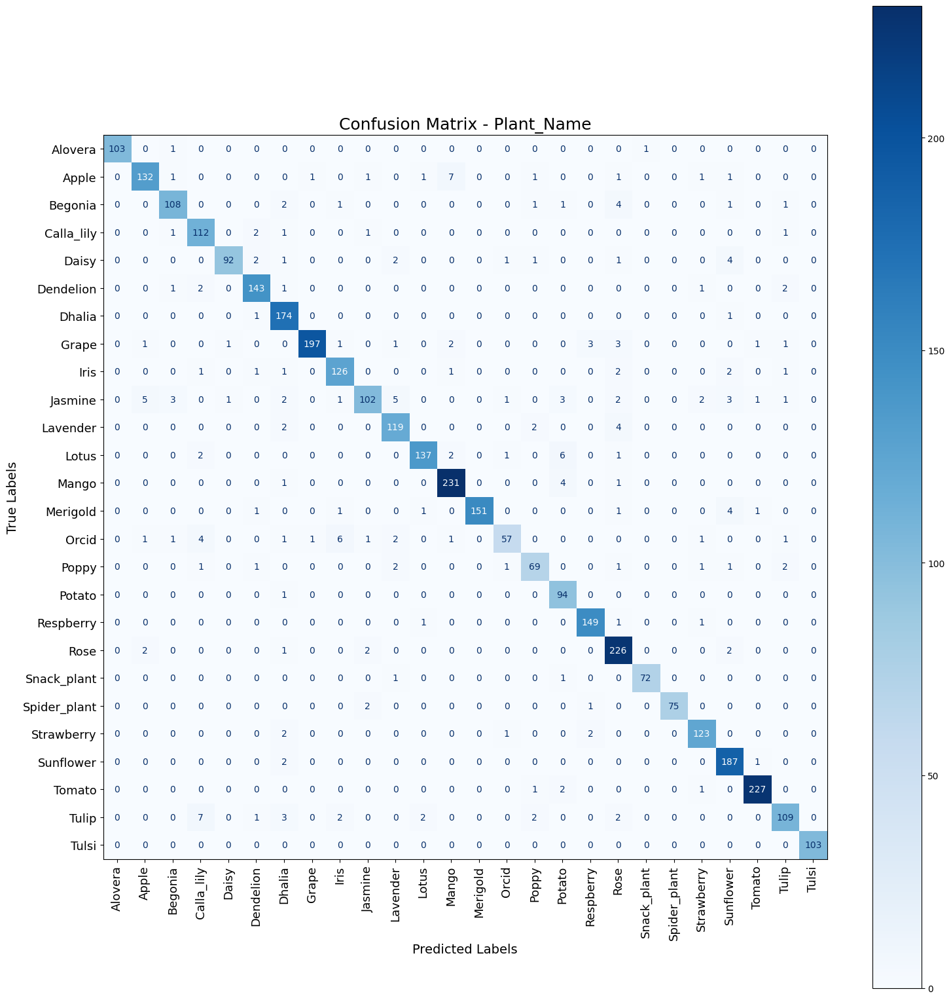


--- Classification Report: Plant_Name ---
              precision    recall  f1-score   support

     Alovera       1.00      0.98      0.99       105
       Apple       0.94      0.90      0.92       147
     Begonia       0.93      0.91      0.92       119
  Calla_lily       0.87      0.95      0.91       118
       Daisy       0.98      0.88      0.93       104
   Dendelion       0.94      0.95      0.95       150
      Dhalia       0.89      0.99      0.94       176
       Grape       0.99      0.93      0.96       211
        Iris       0.91      0.93      0.92       135
     Jasmine       0.94      0.77      0.85       132
    Lavender       0.90      0.94      0.92       127
       Lotus       0.96      0.92      0.94       149
       Mango       0.95      0.97      0.96       237
    Merigold       1.00      0.94      0.97       160
       Orcid       0.92      0.74      0.82        77
       Poppy       0.90      0.87      0.88        79
      Potato       0.85      0.99     

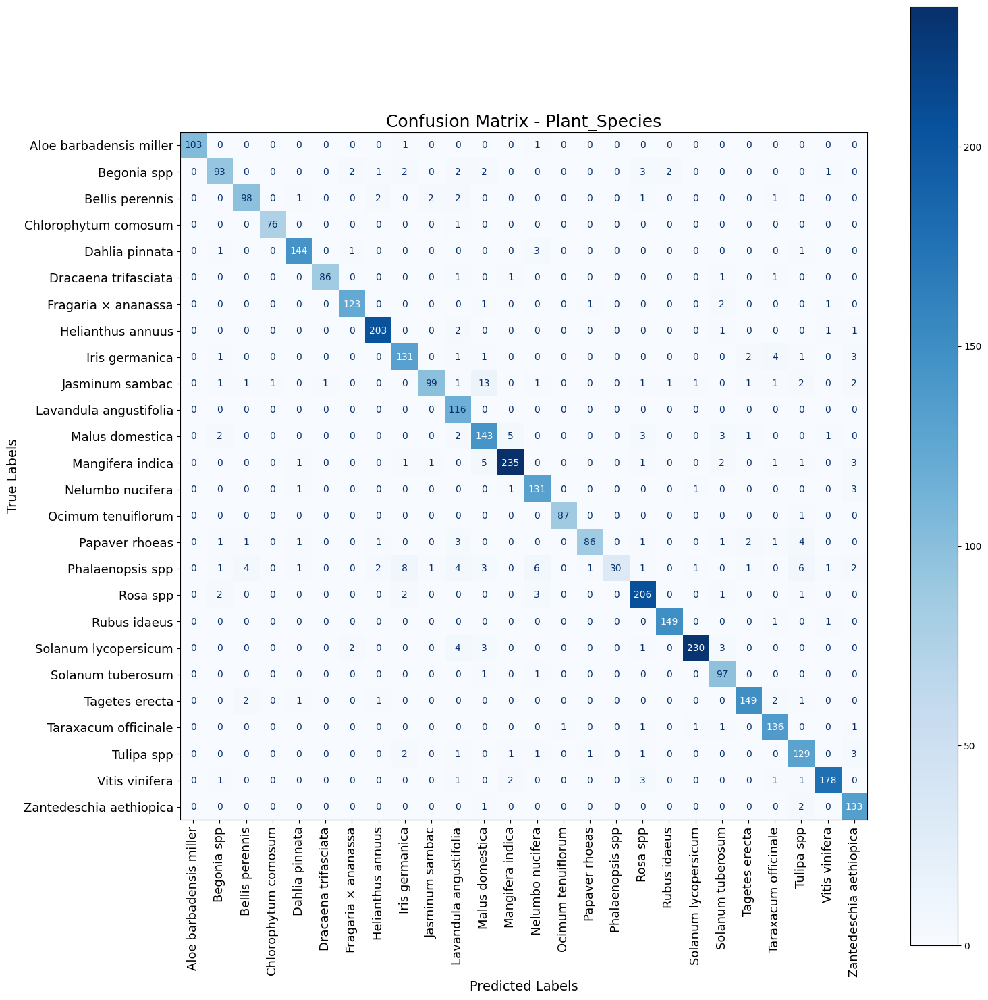


--- Classification Report: Plant_Species ---
                         precision    recall  f1-score   support

Aloe barbadensis miller       1.00      0.98      0.99       105
            Begonia spp       0.90      0.86      0.88       108
        Bellis perennis       0.92      0.92      0.92       107
   Chlorophytum comosum       0.99      0.99      0.99        77
         Dahlia pinnata       0.96      0.96      0.96       150
   Dracaena trifasciata       0.99      0.96      0.97        90
    Fragaria × ananassa       0.96      0.96      0.96       128
      Helianthus annuus       0.97      0.98      0.97       208
         Iris germanica       0.89      0.91      0.90       144
        Jasminum sambac       0.96      0.78      0.86       127
 Lavandula angustifolia       0.82      1.00      0.90       116
        Malus domestica       0.83      0.89      0.86       160
       Mangifera indica       0.96      0.94      0.95       251
       Nelumbo nucifera       0.89      0.9

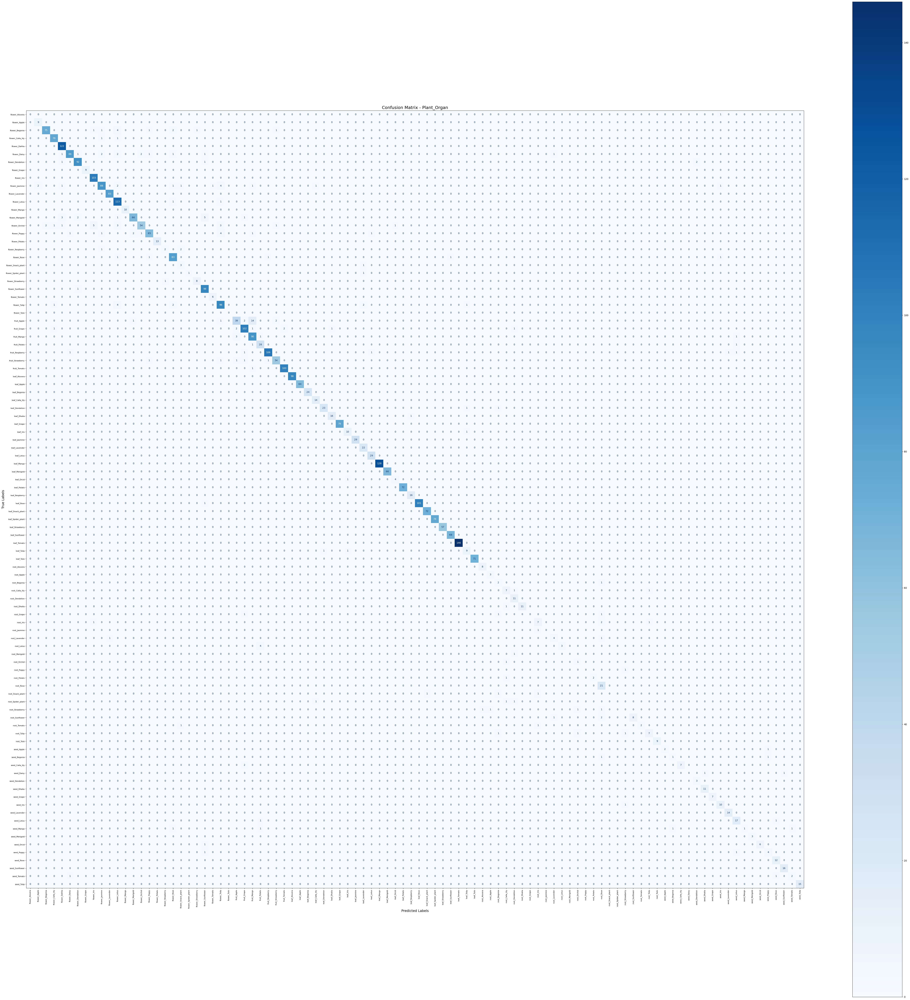


--- Classification Report: Plant_Organ ---
                     precision    recall  f1-score   support

     flower_Alovera       0.00      0.00      0.00         1
       flower_Apple       0.82      1.00      0.90         9
     flower_Begonia       0.97      0.87      0.92        86
  flower_Calla_lily       0.95      0.97      0.96        80
      flower_Dahlia       0.95      1.00      0.97       122
       flower_Daisy       0.97      0.88      0.92        98
   flower_Dendelion       0.96      0.96      0.96        96
       flower_Grape       1.00      1.00      1.00         9
        flower_Iris       0.94      1.00      0.97       103
     flower_Jasmine       0.94      0.85      0.89       103
    flower_Lavender       0.99      1.00      0.99        83
       flower_Lotus       0.86      0.98      0.92       115
       flower_Mango       1.00      1.00      1.00        10
    flower_Marigold       0.96      0.85      0.90        78
      flower_Orchid       0.95      0.76

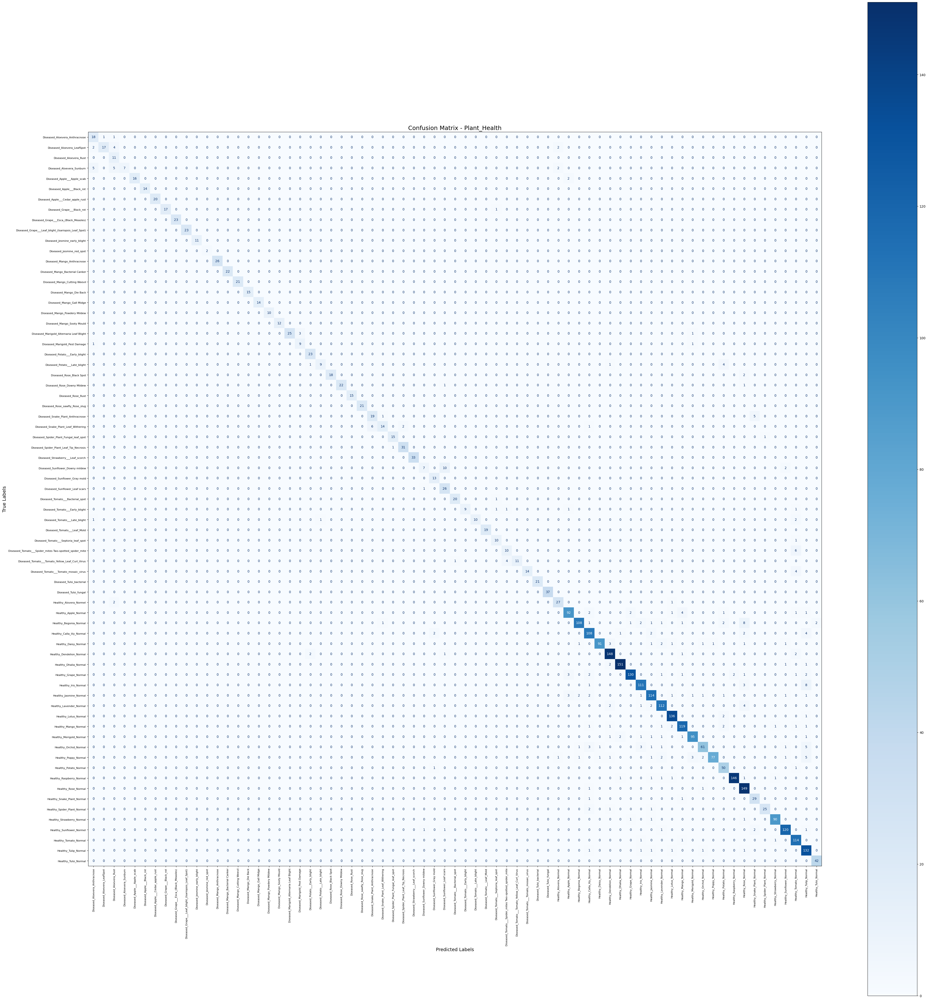


--- Classification Report: Plant_Health ---
                                                        precision    recall  f1-score   support

                         Diseased_Aloevera_Anthracnose       0.67      0.90      0.77        20
                            Diseased_Aloevera_LeafSpot       0.94      0.68      0.79        25
                                Diseased_Aloevera_Rust       0.48      1.00      0.65        11
                             Diseased_Aloevera_Sunburn       1.00      0.37      0.54        19
                           Diseased_Apple___Apple_scab       1.00      0.89      0.94        18
                            Diseased_Apple___Black_rot       1.00      1.00      1.00        14
                     Diseased_Apple___Cedar_apple_rust       1.00      1.00      1.00        20
                            Diseased_Grape___Black_rot       1.00      0.94      0.97        18
                 Diseased_Grape___Esca_(Black_Measles)       1.00      1.00      1.00     

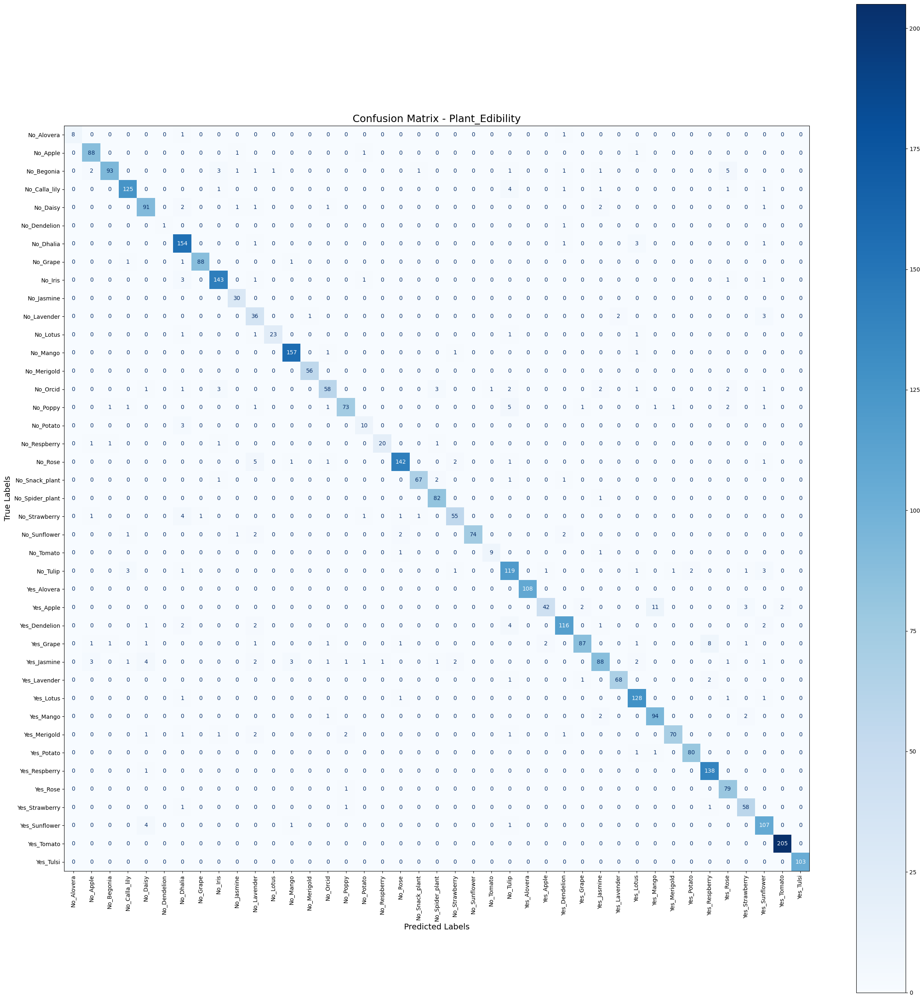


--- Classification Report: Plant_Edibility ---
                 precision    recall  f1-score   support

     No_Alovera       1.00      0.80      0.89        10
       No_Apple       0.92      0.97      0.94        91
     No_Begonia       0.97      0.85      0.90       110
  No_Calla_lily       0.95      0.93      0.94       134
       No_Daisy       0.88      0.92      0.90        99
   No_Dendelion       1.00      0.50      0.67         2
      No_Dhalia       0.88      0.96      0.92       160
       No_Grape       0.99      0.97      0.98        91
        No_Iris       0.93      0.95      0.94       150
     No_Jasmine       0.88      1.00      0.94        30
    No_Lavender       0.64      0.86      0.73        42
       No_Lotus       0.96      0.85      0.90        27
       No_Mango       0.96      0.98      0.97       160
    No_Merigold       0.98      1.00      0.99        56
       No_Orcid       0.89      0.77      0.83        75
       No_Poppy       0.94      0.83   

In [6]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import numpy as np

def evaluate_model(model, val_ds, class_names, title):
    val_images, val_labels = [], []

    # Collect all images and labels
    for x, y in val_ds:
        val_images.append(x.numpy())
        val_labels.append(y.numpy())
    val_images = np.concatenate(val_images)
    val_labels = np.concatenate(val_labels)

    # Predictions
    pred_labels = np.argmax(model.predict(val_images, verbose=0), axis=1)

    # Confusion matrix
    all_labels = np.arange(len(class_names))
    cm = confusion_matrix(val_labels, pred_labels, labels=all_labels)

    # ---- Adjust figure size and font based on number of classes ----
    num_classes = len(class_names)
    figsize = max(12, num_classes * 0.6)  # scale figure more aggressively for many classes
    plt.figure(figsize=(figsize, figsize))

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(
        cmap=plt.cm.Blues,
        ax=plt.gca(),
        xticks_rotation=90,
        values_format='d',
        colorbar=True
    )

    # Font scaling
    font_size = max(8, 18 - num_classes // 5)  # decrease font slightly for large number of classes
    plt.title(f'Confusion Matrix - {title}', fontsize=18)
    plt.xticks(fontsize=font_size, rotation=90)
    plt.yticks(fontsize=font_size)

    plt.xlabel("Predicted Labels", fontsize=14)
    plt.ylabel("True Labels", fontsize=14)

    plt.tight_layout()
    plt.show()

    # ---- Classification Report ----
    print(f"\n--- Classification Report: {title} ---")
    print(classification_report(
        val_labels,
        pred_labels,
        labels=all_labels,
        target_names=class_names,
        zero_division=0
    ))


# ===============================
# Evaluate ALL 5 Models Together
# ===============================
evaluation_datasets = {
    "Plant_Name": (val_plant_name_ds, plant_names),
    "Plant_Species": (val_plant_species_ds, plant_species),
    "Plant_Organ": (val_plant_organ_ds, plant_organs),
    "Plant_Health": (val_plant_health_ds, plant_health),
    "Plant_Edibility": (val_plant_edibility_ds, plant_edibility),
}

for model_name, (val_ds, class_names) in evaluation_datasets.items():
    model = trained_models[model_name]["model"]
    evaluate_model(model, val_ds, class_names, model_name)


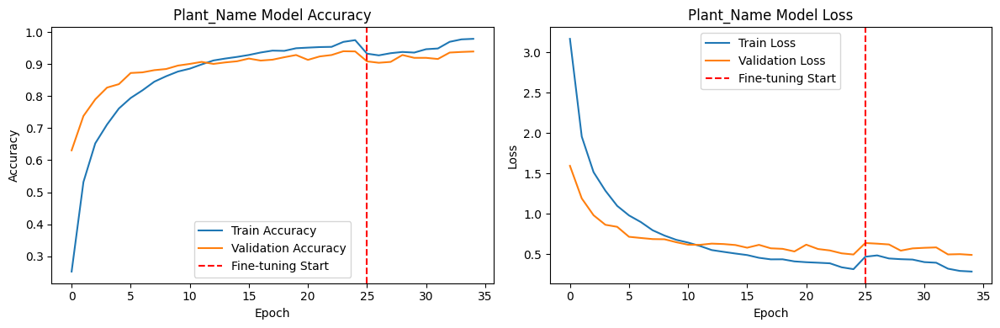

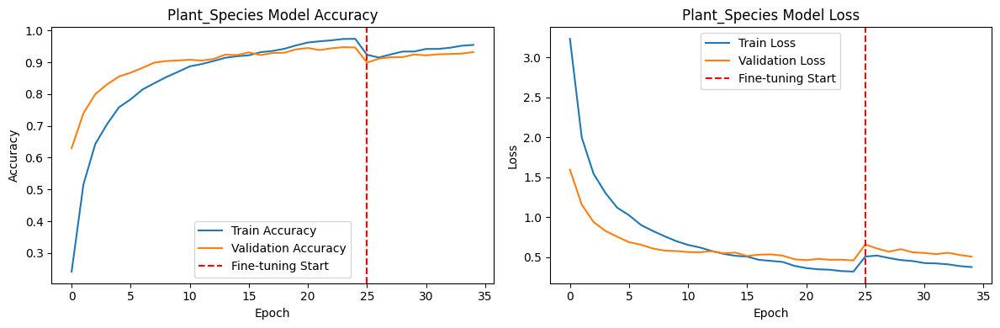

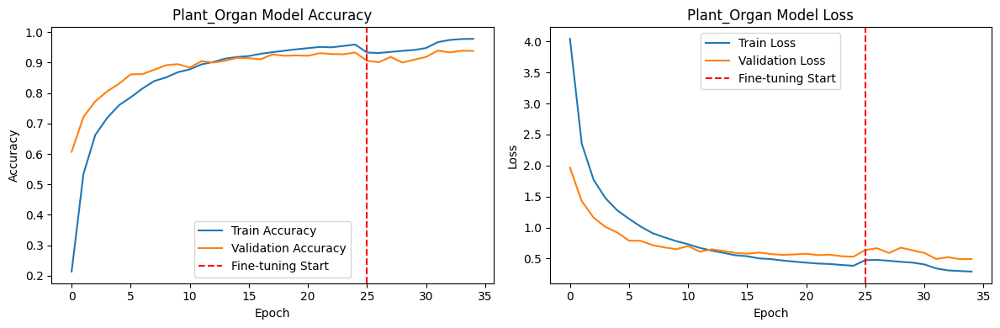

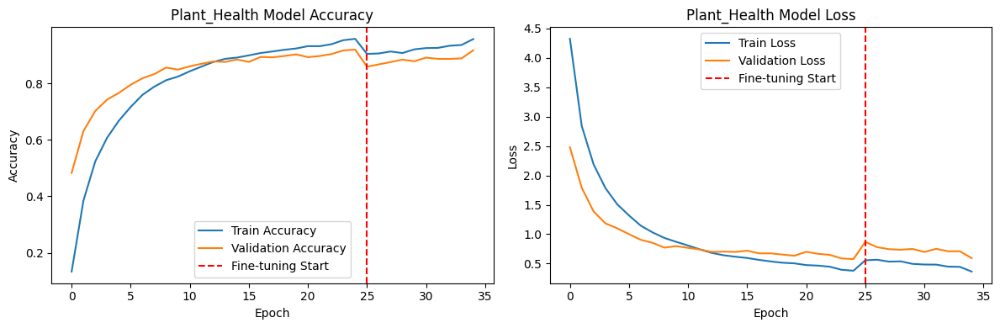

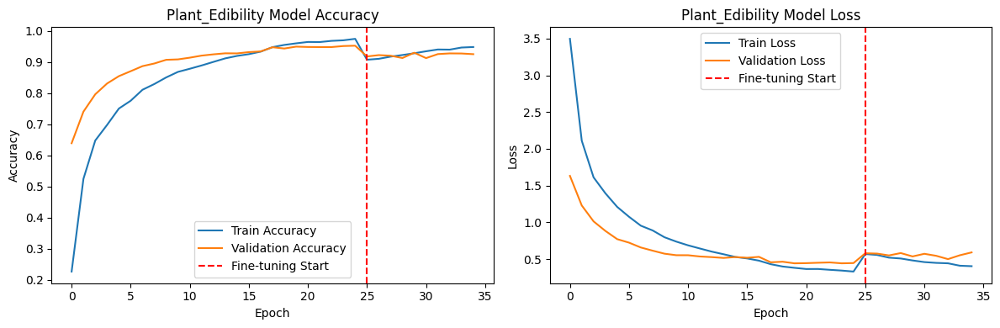

In [7]:
import matplotlib.pyplot as plt

# -----------------------------
# Plot All 5 Models Properly
# -----------------------------

for model_name, data in trained_models.items():

    history_stage1, history_stage2 = data["history"]

    # Combine Stage 1 + Stage 2
    acc = history_stage1.history['accuracy'] + history_stage2.history['accuracy']
    val_acc = history_stage1.history['val_accuracy'] + history_stage2.history['val_accuracy']
    loss = history_stage1.history['loss'] + history_stage2.history['loss']
    val_loss = history_stage1.history['val_loss'] + history_stage2.history['val_loss']

    plt.figure(figsize=(12, 4))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Train Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')

    # Mark Fine-tuning Start
    plt.axvline(x=len(history_stage1.history['accuracy']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    plt.title(f'{model_name} Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Train Loss')
    plt.plot(val_loss, label='Validation Loss')

    plt.axvline(x=len(history_stage1.history['loss']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    plt.title(f'{model_name} Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()


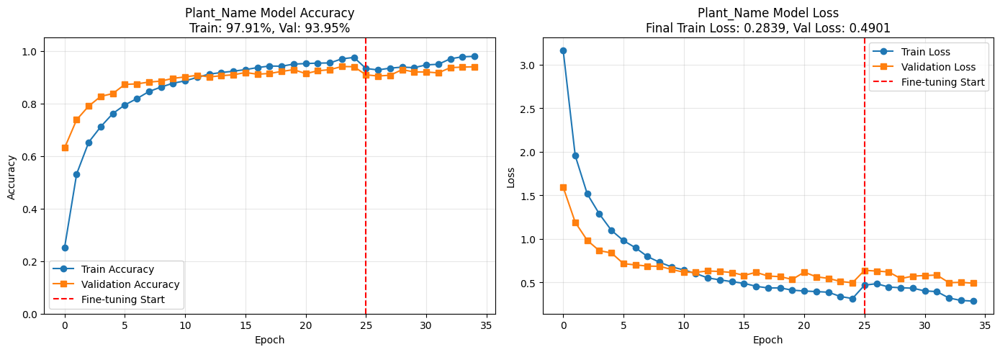

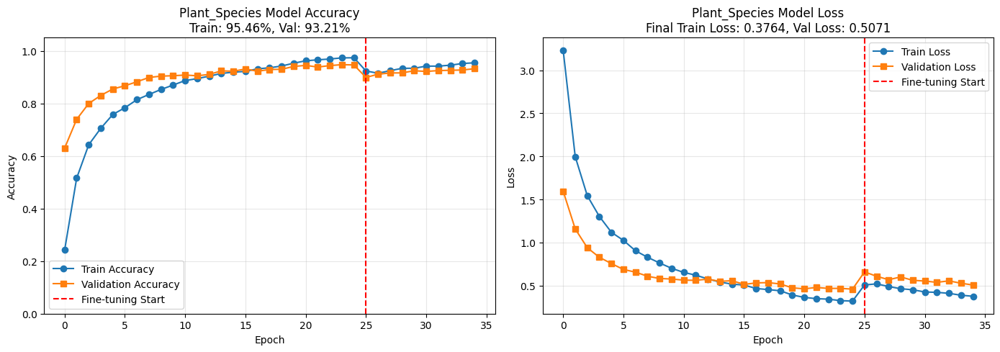

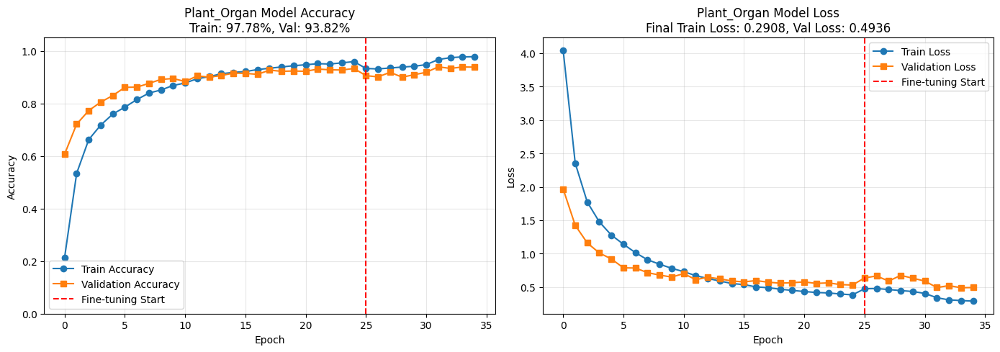

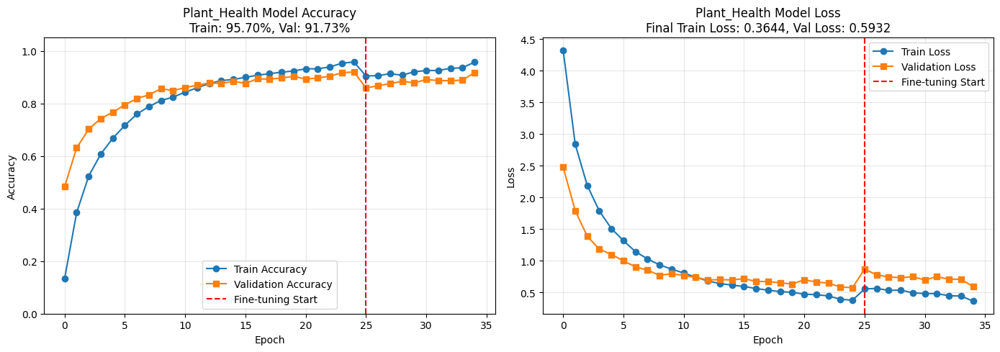

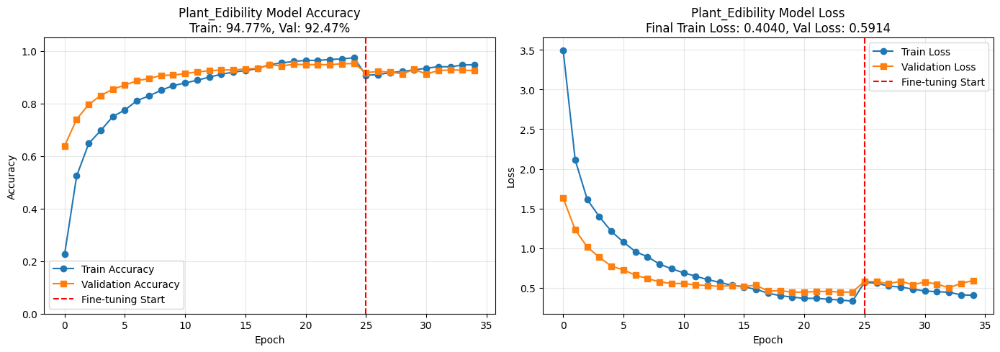

In [9]:
import matplotlib.pyplot as plt

# -----------------------------
# Plot All 5 Models Properly with Accuracy Numbers in Title
# -----------------------------
for model_name, data in trained_models.items():

    history_stage1, history_stage2 = data["history"]

    # Combine Stage 1 + Stage 2
    acc = history_stage1.history['accuracy'] + history_stage2.history['accuracy']
    val_acc = history_stage1.history['val_accuracy'] + history_stage2.history['val_accuracy']
    loss = history_stage1.history['loss'] + history_stage2.history['loss']
    val_loss = history_stage1.history['val_loss'] + history_stage2.history['val_loss']

    plt.figure(figsize=(14, 5))

    # ---- Accuracy Plot ----
    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Train Accuracy', marker='o')
    plt.plot(val_acc, label='Validation Accuracy', marker='s')

    # Mark Fine-tuning Start
    plt.axvline(x=len(history_stage1.history['accuracy']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    # Title with final accuracy numbers
    plt.title(f'{model_name} Model Accuracy\n'
              f'Train: {acc[-1]*100:.2f}%, Val: {val_acc[-1]*100:.2f}%', fontsize=12)

    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1.05)
    plt.legend()
    plt.grid(alpha=0.3)

    # ---- Loss Plot ----
    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Train Loss', marker='o')
    plt.plot(val_loss, label='Validation Loss', marker='s')

    plt.axvline(x=len(history_stage1.history['loss']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    plt.title(f'{model_name} Model Loss\n'
              f'Final Train Loss: {loss[-1]:.4f}, Val Loss: {val_loss[-1]:.4f}', fontsize=12)

    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()


In [10]:

# Prediction Function
def classify_image_5_models(img_path, trained_models, img_size=IMG_SIZE, confidence_threshold=CONFIDENCE_THRESHOLD):
    """
    Predict labels and confidence for all 5 plant models.
    Returns a dictionary with model_name -> (predicted_label, confidence)
    """

    # Class mapping for all 5 models
    class_mappings = {
        "Plant_Name": plant_names,
        "Plant_Species": plant_species,
        "Plant_Organ": plant_organs,
        "Plant_Health": plant_health,
        "Plant_Edibility": plant_edibility
    }

    # Check if image exists
    if not os.path.exists(img_path):
        return {model_name: ("Error: Image not found", 0.0) for model_name in class_mappings.keys()}

    # Load and preprocess image
    img = load_img(img_path, target_size=(img_size, img_size))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Dictionary to store predictions
    results = {}

    # Predict for each model
    for model_name, class_names in class_mappings.items():
        model = trained_models[model_name]["model"]

        pred_probs = model.predict(img_array, verbose=0)[0]
        conf = float(np.max(pred_probs))
        label = class_names[np.argmax(pred_probs)] if conf >= confidence_threshold else "Unknown"

        results[model_name] = (label, conf)

    return results




In [11]:

# Prediction Function
def classify_image_5_models(img_path, trained_models, img_size=IMG_SIZE, confidence_threshold=CONFIDENCE_THRESHOLD):
    """
    Predict labels and confidence for all 5 plant models.
    Returns a dictionary with model_name -> (predicted_label, confidence)
    """

    # Class mapping for all 5 models
    class_mappings = {
        "Plant_Name": plant_names,
        "Plant_Species": plant_species,
        "Plant_Organ": plant_organs,
        "Plant_Health": plant_health,
        "Plant_Edibility": plant_edibility
    }

    # Check if image exists
    if not os.path.exists(img_path):
        return {model_name: ("Error: Image not found", 0.0) for model_name in class_mappings.keys()}

    # Load and preprocess image
    img = load_img(img_path, target_size=(img_size, img_size))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Dictionary to store predictions
    results = {}

    # Predict for each model
    for model_name, class_names in class_mappings.items():
        model = trained_models[model_name]["model"]

        pred_probs = model.predict(img_array, verbose=0)[0]
        conf = float(np.max(pred_probs))
        label = class_names[np.argmax(pred_probs)] if conf >= confidence_threshold else "Unknown"

        results[model_name] = (label, conf)

    return results




In [12]:
# Predict using the new 5-model function
predictions = classify_image_5_models("C:/Users/USER/Desktop/plant1/Images/Plant Name/Rose/Downy Mildew  (27).jpg", trained_models)

# Print all results nicely
for model_name, (label, conf) in predictions.items():
    print(f"{model_name}: {label} ({conf:.2f})")


Plant_Name: Rose (1.00)
Plant_Species: Rosa spp (1.00)
Plant_Organ: leaf_Rose (1.00)
Plant_Health: Diseased_Rose_Downy Mildew (1.00)
Plant_Edibility: No_Rose (1.00)
